###  Lab - 7

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700"> Plant Disease Prediction</div>


            The approach employed to solve this task involves using first a convolutional neural network with 4 cnn layers and evaluate its performance. Then we proceed to using a pre-trained model, add some layers to it, build a model and evaluate it. Then we check compare the performance of these two models.

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700"> Table of Contents</div>

<a id="toc"></a>
- [1. Setup](#1)
    - [1.1. Package and Library](#1.1)
    - [1.2. Load the Data](#1.2)
- [2. Data Explorations](#2)
- [3. Image Processing](#3)
- [4. Spliting](#4)
- [5. CNN Model](#5)
- [6. Transfear Learning](#6)
- [7. Evaluation](#7)
- [8. Predected Images](#8)

# <a id="1"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">1. Setup</div>

<a id="1.1"></a>
# <b><span style='color:#8D6D9B'>1.1. Package and Library</span></b>

In [79]:
import os
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

<a id="1.2"></a>
# <b><span style='color:#8D6D9B'>1.2. Load The Data</span></b>

In [80]:
dataDir = '/kaggle/input/plantdisease/PlantVillage'
selectedClasses = ['Pepper__bell___Bacterial_spot',
                   'Pepper__bell___healthy',
                   'Potato___Early_blight',
                   'Potato___Late_blight',
                   'Tomato_Early_blight',
                   'Tomato_Leaf_Mold']                  # 6 Classes

In [81]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :                  # Select you classes above
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)            # Shuffle

df

,imgPath,label
0,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Early_blight
1,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Late_blight
2,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight
3,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Leaf_Mold
4,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
...,...,...
6422,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___healthy
6423,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___healthy
6424,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight
6425,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___healthy


In [82]:
len(df)

6427

# <a id="2"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">2. Data Explorations</div>

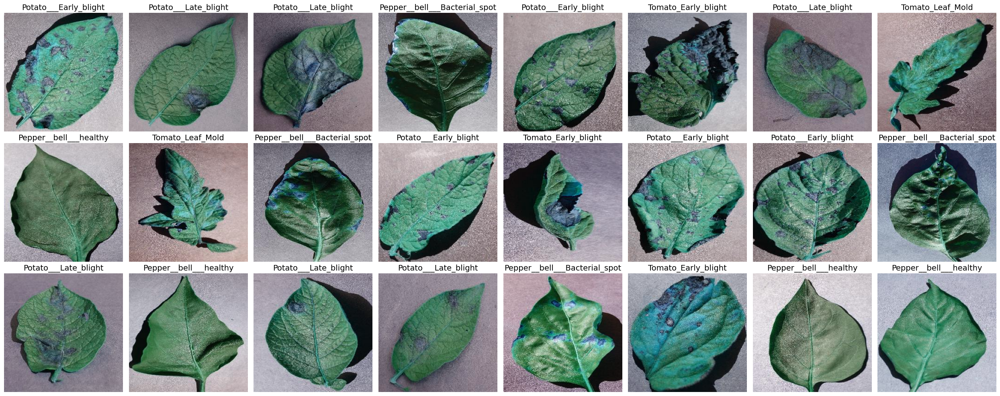

In [83]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

# <a id="3"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">3. Image Processing</div>

In [84]:
df['label'] = df['label'].replace({'Pepper__bell___Bacterial_spot':0 ,
                                   'Pepper__bell___healthy':1 ,
                                   'Potato___Early_blight':2 ,
                                   'Potato___Late_blight':3 ,
                                   'Tomato_Early_blight':4 ,
                                   'Tomato_Leaf_Mold':5}).astype(int)

/tmp/ipykernel_36/300140912.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'Pepper__bell___Bacterial_spot':0 ,


In [85]:
IMG_SIZE = (150,150)   # to free some resources and reduce the execution time
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    imgs.append(img)

100%|██████████| 6427/6427 [00:12<00:00, 531.91it/s]


All the images has the same shape 

In [86]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)

(6427, 6427)

In [87]:
images = images / 255.0         # normalize from 0 --> 255 to 0 --> 1  to reduce the execution time 

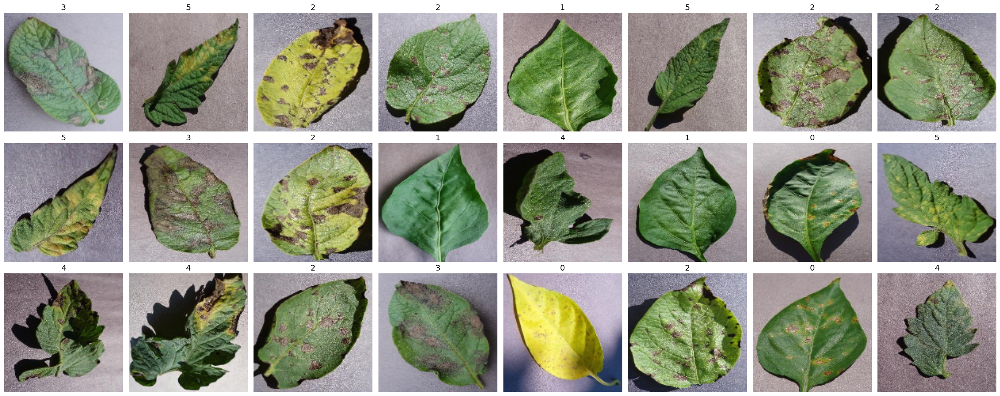

In [88]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label, fontsize=14)
    axs[i].axis('off')
    

plt.tight_layout()
plt.show()

# <a id="4"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">4. Spliting</div>

In [89]:
# Spliting 

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (5141, 150, 150, 3)
Shape of X_test : (1286, 150, 150, 3)
Shape of y_train : (5141,)
Shape of y_test : (1286,)


# <a id="5"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">5. CNN Model</div>


            Here we will build a CNN architecture with 4 convolution layers and one Densely connected layer, then the output layer with 6 neurons

In [90]:
with tf.device('/GPU:0'):
    kerasModel = Sequential([
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID' ,input_shape=(150,150,3)), # padding ='SAME' for using padding
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        Flatten(),

        Dense(128,activation='relu'),
        Dense(6 ,activation='softmax')
    ])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [91]:
kerasModel.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [92]:
kerasModel.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 74, 74, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 72, 72, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 36, 36, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 34, 34, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 17, 17, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 17, 17, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 17, 17, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 15, 15, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 7, 7, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 5, 5, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 2, 2, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 55,814 (218.02 KB)

 Trainable params: 55,494 (216.77 KB)

 Non-trainable params: 320 (1.25 KB)

#### Train the CNN model

In [93]:
history = kerasModel.fit(X_train,y_train,
                         validation_split = 0.2 , 
                         epochs=50,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - accuracy: 0.5781 - loss: 1.1311 - val_accuracy: 0.1623 - val_loss: 6.0884
Epoch 2/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.8055 - loss: 0.5403 - val_accuracy: 0.1623 - val_loss: 8.5949
Epoch 3/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8259 - loss: 0.4822 - val_accuracy: 0.1623 - val_loss: 11.1184
Epoch 4/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8763 - loss: 0.3794 - val_accuracy: 0.1623 - val_loss: 9.3905
Epoch 5/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.8898 - loss: 0.3230 - val_accuracy: 0.1740 - val_loss: 6.3729
Epoch 6/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9043 - loss: 0.2761 - val_accuracy: 0.2818 - val_loss: 4.0225
Epoch 7/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9093 - loss: 0.2639 - val_accuracy: 0.3188 - val_loss: 3.0619
Epoch 8/50
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9228 - loss: 0.2277 - val_accuracy: 0.6706 

### Make Predictions on unseen data for the  CNN model

In [94]:
y_pred = kerasModel.predict(X_test)

41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


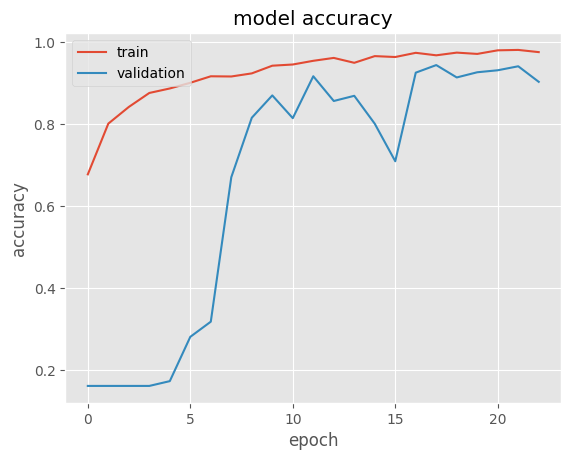

In [95]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [96]:
y_test[:10]

array([0, 3, 2, 1, 1, 1, 0, 2, 1, 4])

In [97]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[0, 3, 2, 1, 1, 1, 0, 3, 1, 0]

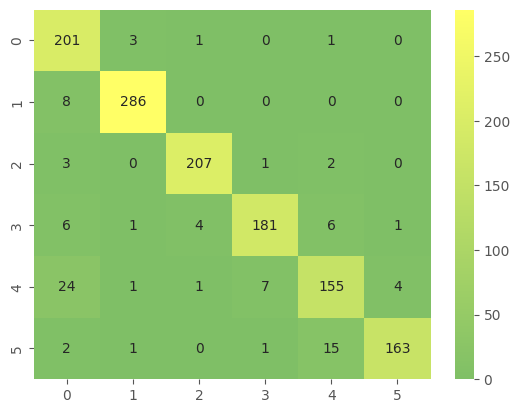

In [98]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [99]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.82      0.98      0.89       206
           1       0.98      0.97      0.98       294
           2       0.97      0.97      0.97       213
           3       0.95      0.91      0.93       199
           4       0.87      0.81      0.84       192
           5       0.97      0.90      0.93       182

    accuracy                           0.93      1286
   macro avg       0.93      0.92      0.92      1286
weighted avg       0.93      0.93      0.93      1286



The CNN arhitecture in this case had a very good accuracy of 93 %. This was achieved at the first run without any hyperparamters tuning.


Next we will try the transfer Learning approach to see if we can beat this CNN accuracy. Let's go, i love adventure.

# <a id="6"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">6. Transfear Learning</div>

We will use VGG16 pretrained model 

In [100]:
custom_input = Input(shape=(150, 150, 3))           # To customize the input shape of PreTrained model  

with tf.device('/GPU:0'):          # to use GPU
    Model = Sequential([

        VGG16(weights='imagenet', include_top=False, input_tensor=custom_input),
        
        Flatten(),                                     # because we ignore the flatten and dense layers when include_top = False 
        
        Dense(128,activation='relu'),
        Dropout(0.2),

        Dense(6 ,activation='softmax')
    ])

In [101]:
VGG16Layers = Model.layers[0]
for layer in VGG16Layers.layers[1:-3]:           # freez all layers except the first and last 3 layers, we will make them trainable (weights changes with training)
    layer.trainable = False

In [102]:
Model.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [103]:
history = Model.fit(X_train,y_train,
                         validation_split = 0.2 ,
                         epochs=50,
                         batch_size=100, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - accuracy: 0.4490 - loss: 1.5054 - val_accuracy: 0.8523 - val_loss: 0.3950
Epoch 2/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.8496 - loss: 0.3935 - val_accuracy: 0.8669 - val_loss: 0.3840
Epoch 3/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.9124 - loss: 0.2330 - val_accuracy: 0.9388 - val_loss: 0.1756
Epoch 4/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - accuracy: 0.9404 - loss: 0.1669 - val_accuracy: 0.9456 - val_loss: 0.1812
Epoch 5/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.9627 - loss: 0.0988 - val_accuracy: 0.9534 - val_loss: 0.1482
Epoch 6/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - accuracy: 0.9708 - loss: 0.0811 - val_accuracy: 0.9514 - val_loss: 0.1367
Epoch 7/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.9867 - loss: 0.0366 - val_accuracy: 0.9621 - val_loss: 0.1552
Epoch 8/50
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - accuracy: 0.9892 - loss: 0.0306 - val_accuracy: 0

In [104]:
Model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,302,356 (104.15 MB)

 Trainable params: 5,769,094 (22.01 MB)

 Non-trainable params: 9,995,072 (38.13 MB)

 Optimizer params: 11,538,190 (44.01 MB)

# <a id="7"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">7. Evaluation</div>

In [105]:
y_pred = Model.predict(X_test)

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step


In [106]:
print(f'Prediction items : \n{y_pred[:5]}')

Prediction items : 
[[9.9803931e-01 1.9569614e-03 2.3406942e-06 2.2656417e-07 1.1690436e-06
  9.7552029e-09]
 [4.0304535e-12 2.2697005e-10 9.2018745e-06 9.9999082e-01 1.2245119e-10
  2.8828898e-10]
 [5.1857731e-13 1.6440220e-13 1.0000000e+00 3.1051147e-08 2.1388041e-10
  2.6605777e-13]
 [4.3984849e-07 9.9999952e-01 1.4605263e-08 4.0262154e-09 1.3116604e-10
  4.5211692e-09]
 [2.2541635e-06 9.9999201e-01 9.6963493e-07 4.6867444e-06 5.4155409e-09
  1.4607807e-07]]


In [107]:
print(f'Prediction items after rounding :  \n{np.round(y_pred[:5])}')

Prediction items after rounding :  
[[1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]]


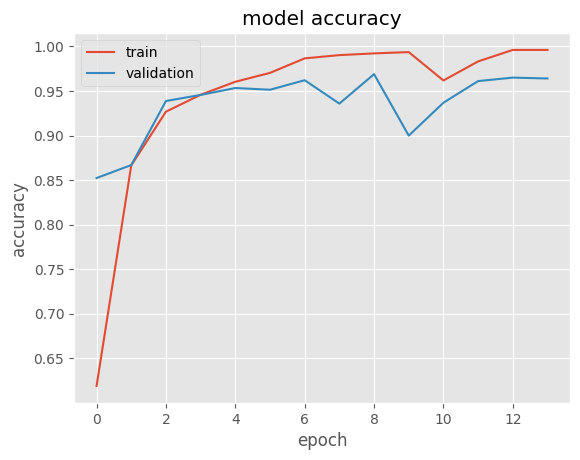

In [108]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [109]:
y_test[:10]

array([0, 3, 2, 1, 1, 1, 0, 2, 1, 4])

In [110]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[0, 3, 2, 1, 1, 1, 0, 3, 1, 4]

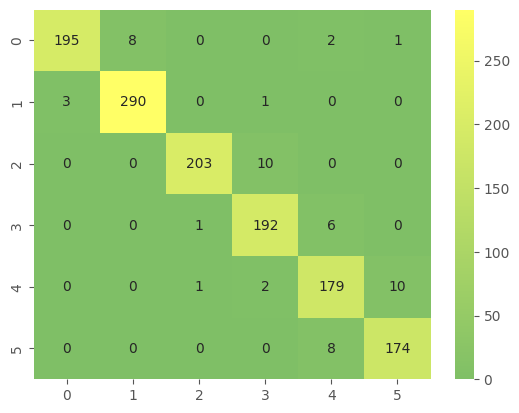

In [111]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [112]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.98      0.95      0.97       206
           1       0.97      0.99      0.98       294
           2       0.99      0.95      0.97       213
           3       0.94      0.96      0.95       199
           4       0.92      0.93      0.93       192
           5       0.94      0.96      0.95       182

    accuracy                           0.96      1286
   macro avg       0.96      0.96      0.96      1286
weighted avg       0.96      0.96      0.96      1286



### Conclusion


The second approach beats the first one. We now have an accuracy of 96%  using Transfer Learning. 